In [1]:
#data analysis from Hang's p28 WT data

In [2]:
import scvelo as scv
import numpy as np
import pandas as pd
import scanpy as sc
import loompy
import matplotlib as mpl
import matplotlib.pyplot as pl

import collections.abc
#cellrank needs the following alias to be done manually.
collections.Iterable = collections.abc.Iterable
import cellrank as cr
from scipy.stats import mode
from collections import Counter
from matplotlib import rcParams
#import diffxpy as de
#import palantir
import seaborn
import warnings
import scanpy.external as sce

In [3]:
#settings
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.set_figure_params(color_map='viridis')
sc.settings.set_figure_params(dpi=80, facecolor='white')
scv.settings.presenter_view = True  # set max width size for presenter view
scv.set_figure_params('scvelo')  # for beautified visualization

scanpy==1.9.3 anndata==0.9.1 umap==0.5.3 numpy==1.23.5 scipy==1.10.1 pandas==2.0.1 scikit-learn==1.2.2 statsmodels==0.14.0 python-igraph==0.10.4 pynndescent==0.5.10


In [4]:
adata = sc.read_10x_mtx('C:/Users/rvi33352/Documents/Sox2TdT_C18A2CE/Hang/p28-1',  # the directory with the `.mtx` file
    var_names='gene_symbols',                # use gene symbols for the variable names (variables-axis index)
    cache=True)                              # write a cache file for faster subsequent reading

... reading from cache file cache\C-Users-rvi33352-Documents-Sox2TdT_C18A2CE-Hang-p28-1-matrix.h5ad


In [5]:
adata

AnnData object with n_obs × n_vars = 11948 × 32285
    var: 'gene_ids', 'feature_types'

In [6]:
adata.var_names_make_unique()

normalizing counts per cell
    finished (0:00:00)


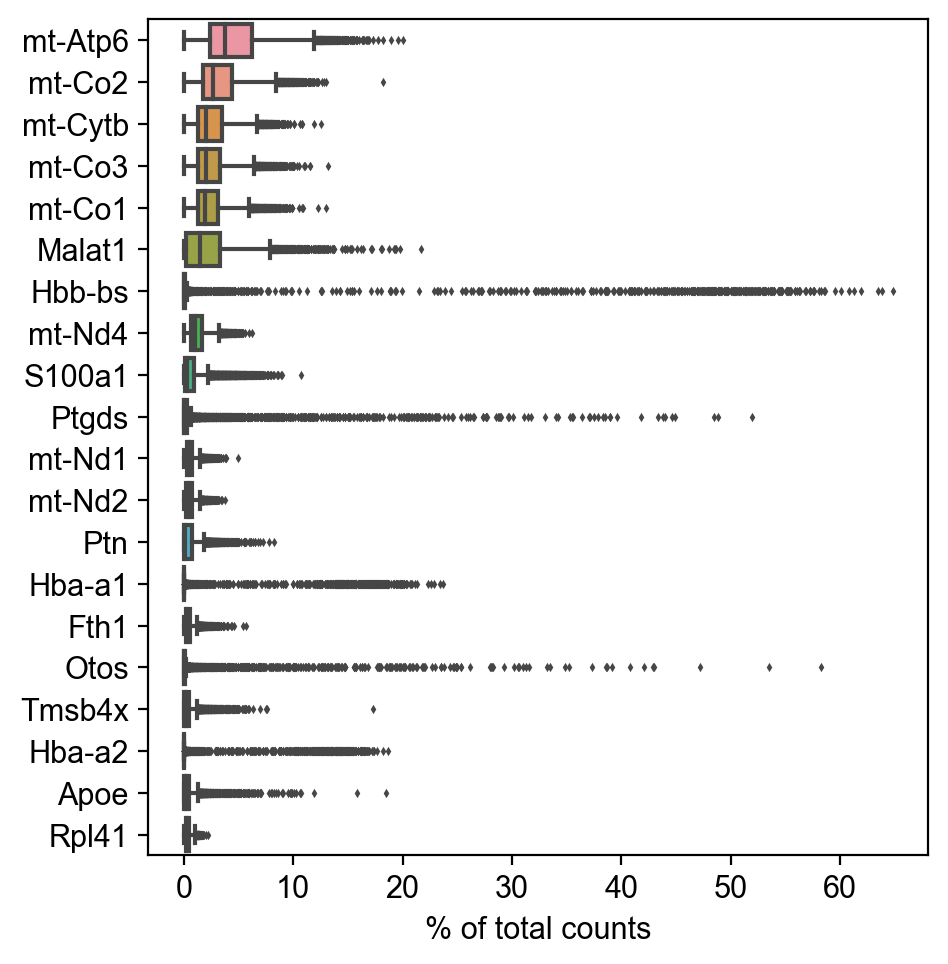

In [7]:
#highest expressed genes
sc.pl.highest_expr_genes(adata, n_top=20, )

filtered out 322 cells that have less than 200 genes expressed
filtered out 13850 genes that are detected in less than 3 cells


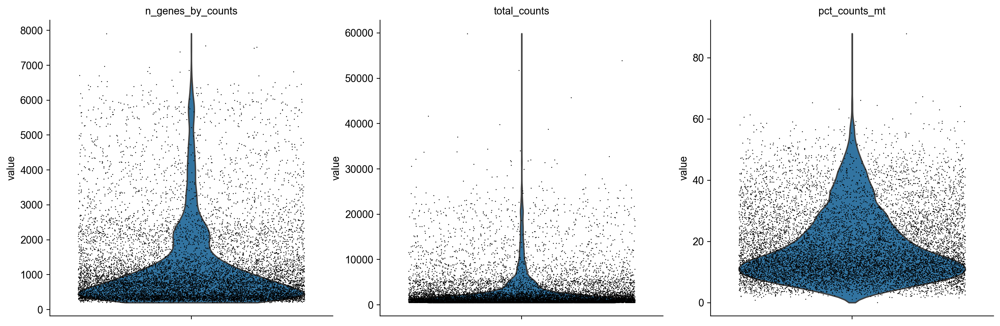

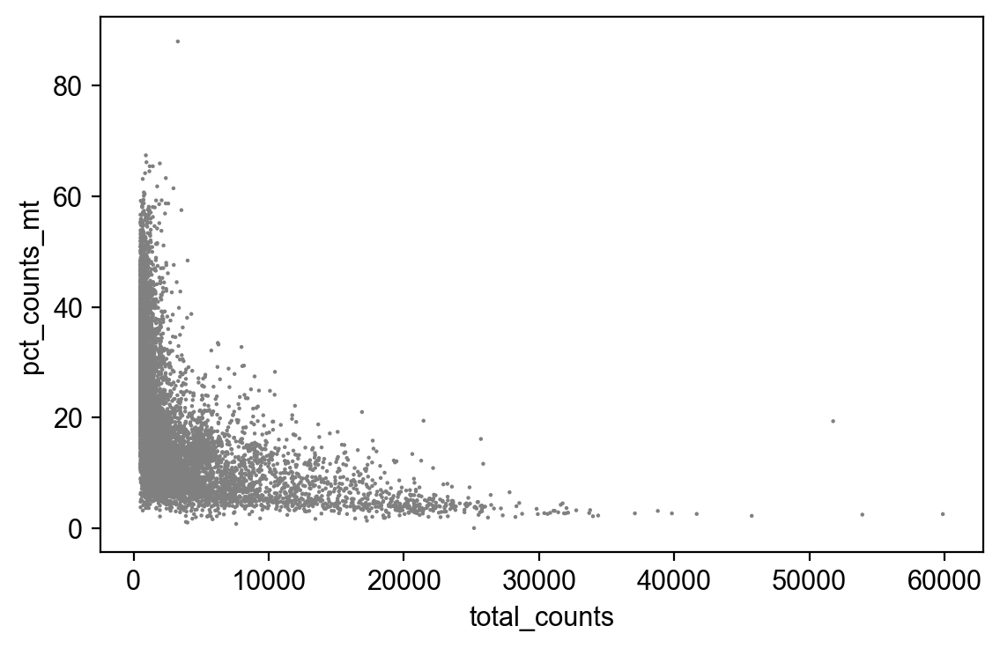

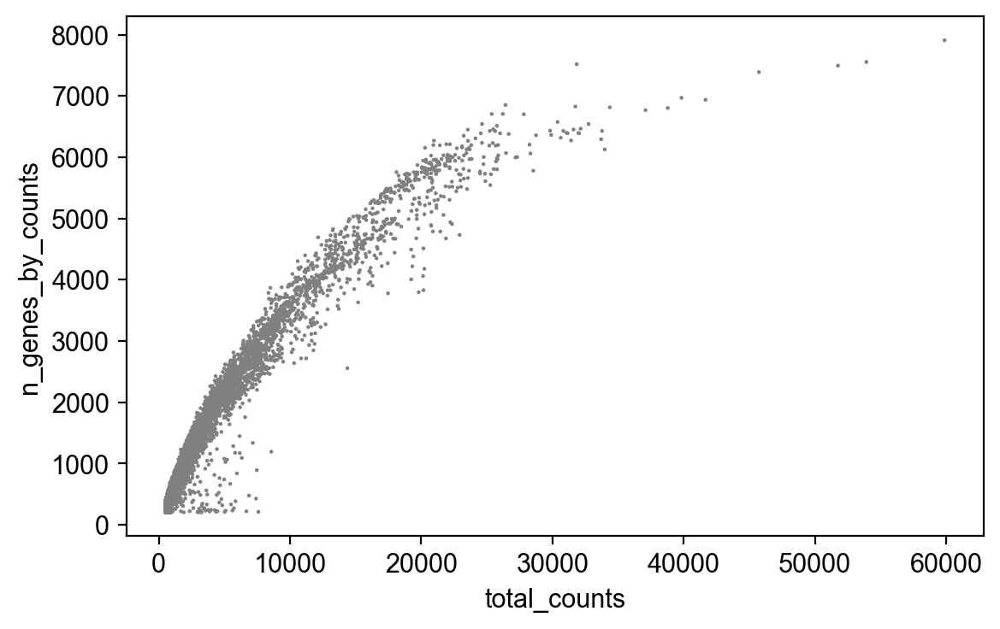

normalizing counts per cell
    finished (0:00:00)


C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [8]:
#filtering and normalization
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)
adata.var['mt'] = adata.var_names.str.startswith('mt-')
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')
adata = adata[adata.obs.n_genes_by_counts < 2500, :]
adata = adata[adata.obs.pct_counts_mt < 20, :]
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

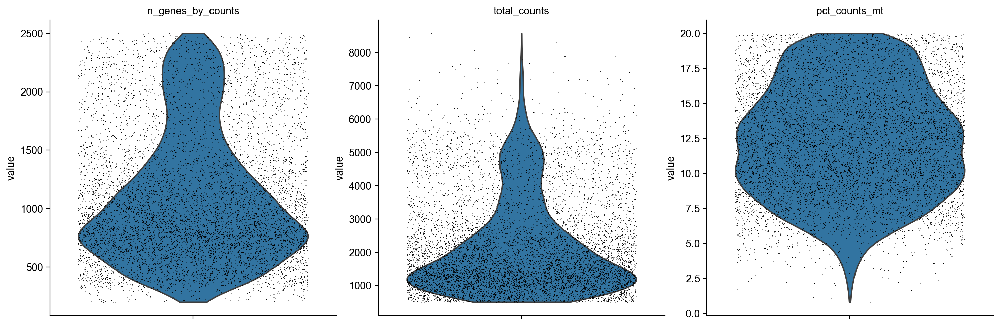

In [9]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


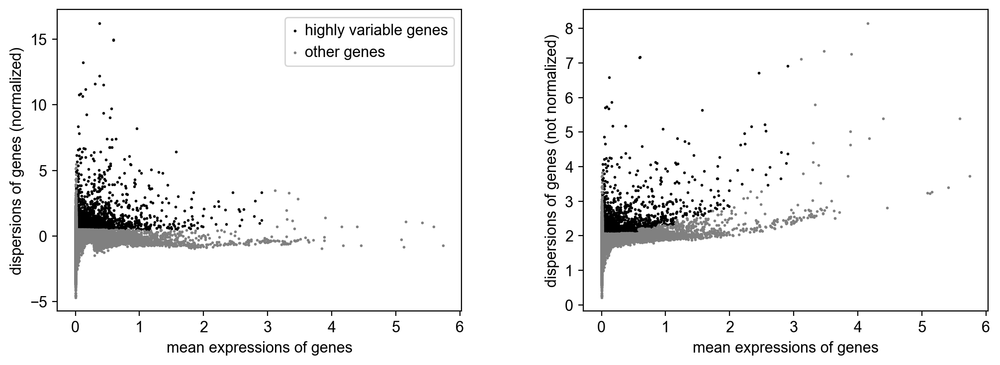

In [10]:
#identify highly variable genes
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(adata)

In [11]:
adata

AnnData object with n_obs × n_vars = 6280 × 18435
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

In [12]:
#set raw data
adata.raw = adata

In [13]:
#filtering, regression and scaling
adata = adata[:, adata.var.highly_variable]

In [14]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:13)


In [15]:
sc.pp.scale(adata, max_value=10)

In [16]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=20)

computing neighbors
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:01)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)


In [17]:
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)


computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)


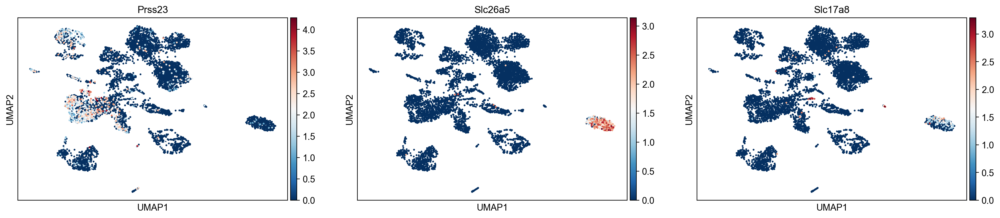

In [18]:
sc.tl.umap(adata) 
sc.pl.umap(adata, color=['Prss23', 'Slc26a5', 'Slc17a8']) 

In [29]:
sc.tl.leiden(adata, resolution = 0.1)

running Leiden clustering
    finished: found 12 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


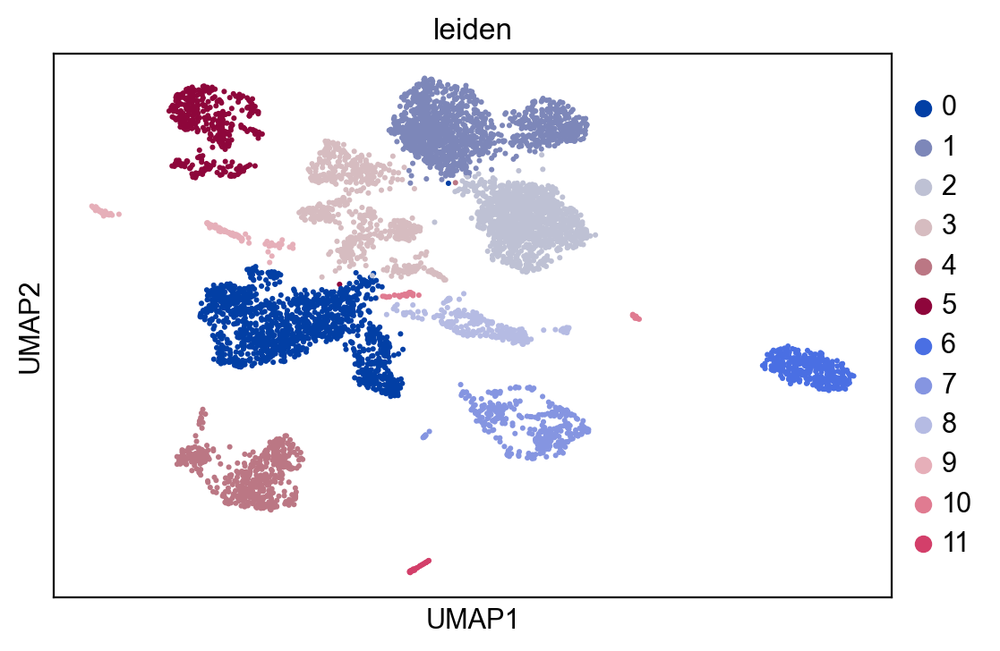

In [30]:
sc.pl.umap(adata, color = 'leiden')

In [31]:
marker_genes = ["Sox2", "Sox9", "Sox10", "Lfng", "Cdkn1b", "Gjb2", "Prss23", "S100a6", 
                "S100a1", "Slc1a3", "Fst", "Fabp7", "Fgfr3", "Lgr5", "Gata3", "Spry2", "Myo6", 
                "Myo7a", "Slc26a5", "Slc17a8", "Otof", "Ocm", "Pvalb", "Calb2", "Ikzf2",
               "Tbx2", "Pou4f3", "Pcp4", "Espn", "Isl1", "Nefh", "Thy1", "Tubb3", "Cldn11", 
               "Met", "Dct", "Coch", "Emilin2", "Kcnq1", "Cx3cr1", "Cd3g", "Cd4", "Mpz", 
                  "Mbp", "Plp1", "Slc26a4", "Vmo1", "Itgam", "Cd79a", "Hba-a1", "Hba-a2"]

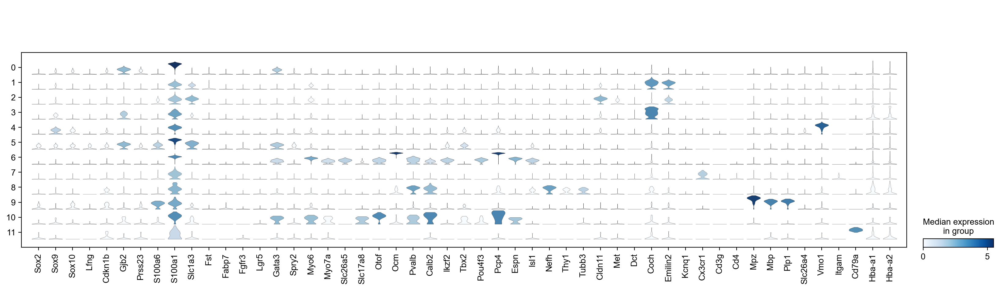

In [32]:
sc.pl.stacked_violin(adata, marker_genes, groupby='leiden', rotation=90);

In [33]:
#rename clusters
new_cluster_names = ['IS/OS', 'TBC', 'Basal Cells', 'Spiral Ligament/Limbus', 'RM', 'SC1', 'OHC', 'MP',
                    'SGN', 'Schwann', 'IHC', 'B-Cells']
adata.rename_categories('leiden', new_cluster_names)

C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


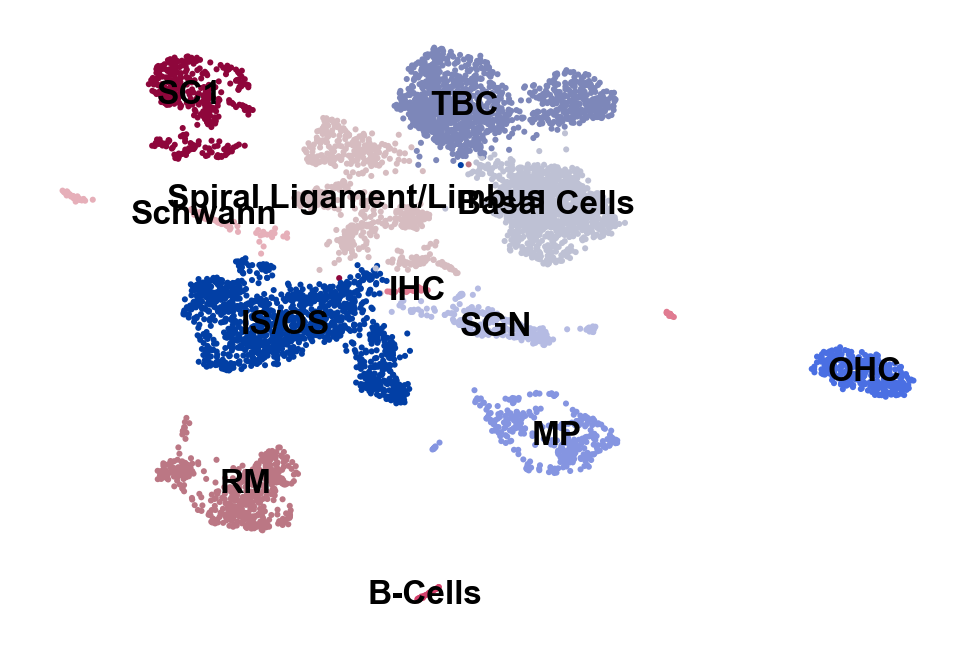

In [34]:
sc.pl.umap(adata, color='leiden', legend_loc='on data', title='', frameon=False, save='.pdf')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


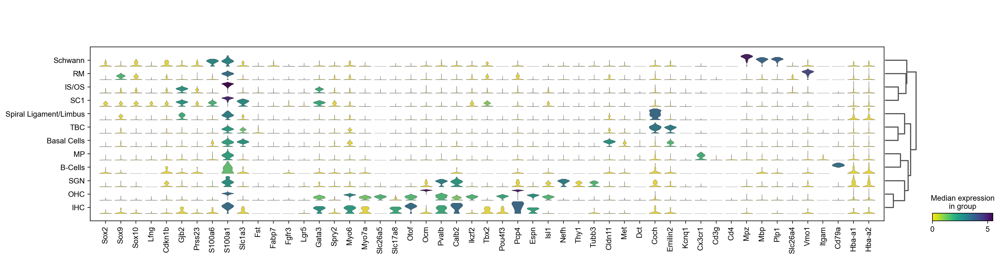

In [35]:
sc.pl.stacked_violin(adata, marker_genes, groupby='leiden', rotation=90, dendrogram=True,
                      cmap='viridis_r');

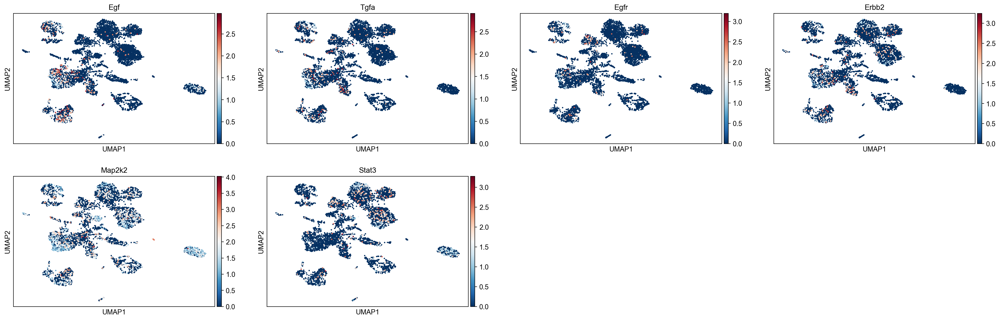

In [41]:
#For EGFR data
sc.pl.umap(adata, color=['Egf', 'Tgfa', 'Egfr', 'Erbb2', 'Map2k2', 'Stat3'])

In [128]:
egfr_genes = ['Egf', 'Tgfa', 'Egfr', 'Erbb2', 'Akt1', 'Mapk3', 'Map2k2', 'Stat3']

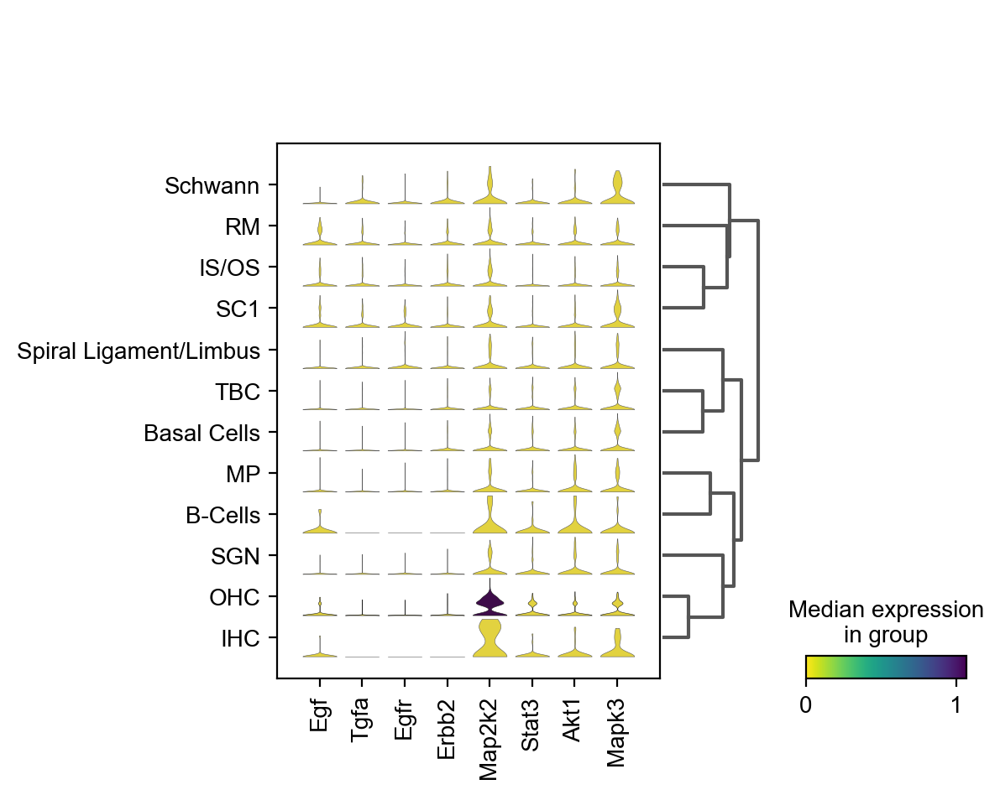

In [121]:
sc.pl.stacked_violin(adata, egfr_genes, groupby='leiden', rotation=90, dendrogram=True,
                      cmap='viridis_r');

In [53]:
bdata = sc.read_10x_mtx('C:/Users/rvi33352/Documents/Sox2TdT_C18A2CE/Hang/p28-2',  # the directory with the `.mtx` file
    var_names='gene_symbols',                # use gene symbols for the variable names (variables-axis index)
    cache=True)                              # write a cache file for faster subsequent reading

... reading from cache file cache\C-Users-rvi33352-Documents-Sox2TdT_C18A2CE-Hang-p28-2-matrix.h5ad


In [54]:
bdata

AnnData object with n_obs × n_vars = 18196 × 32285
    var: 'gene_ids', 'feature_types'

In [55]:
bdata.var_names_make_unique()

normalizing counts per cell
    finished (0:00:00)


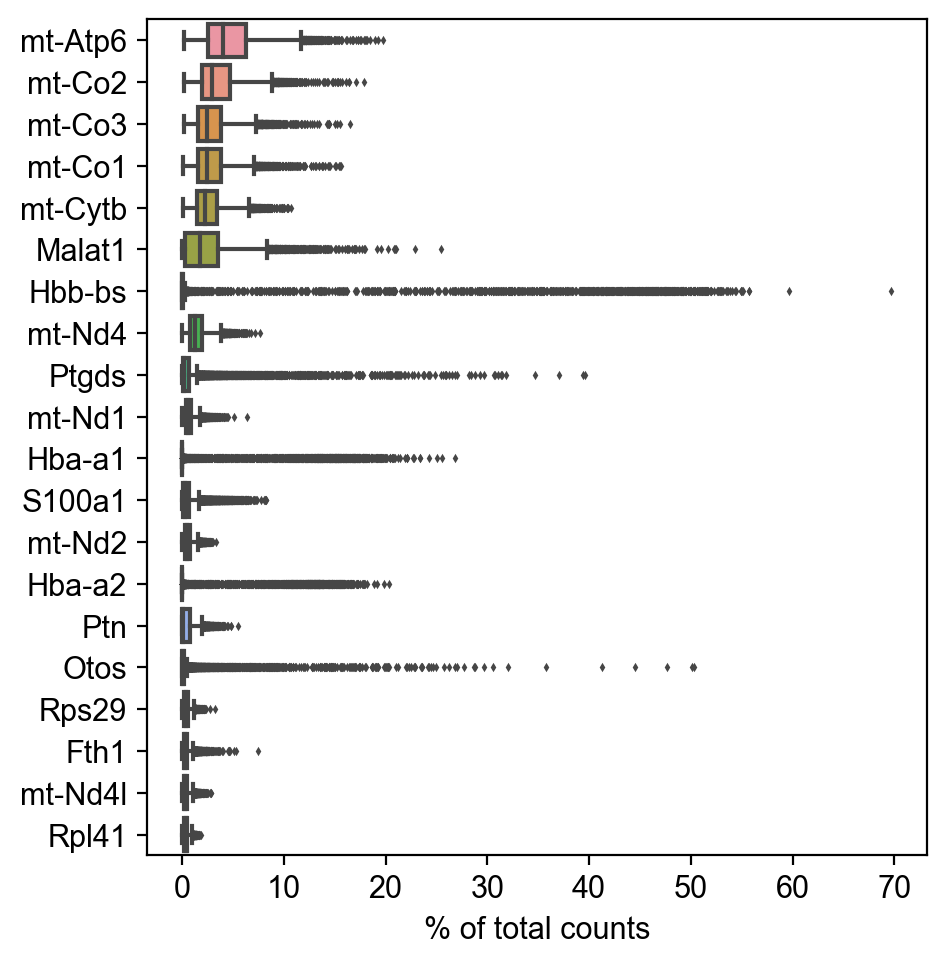

In [56]:
#highest expressed genes
sc.pl.highest_expr_genes(bdata, n_top=20, )

filtered out 522 cells that have less than 200 genes expressed
filtered out 13737 genes that are detected in less than 3 cells


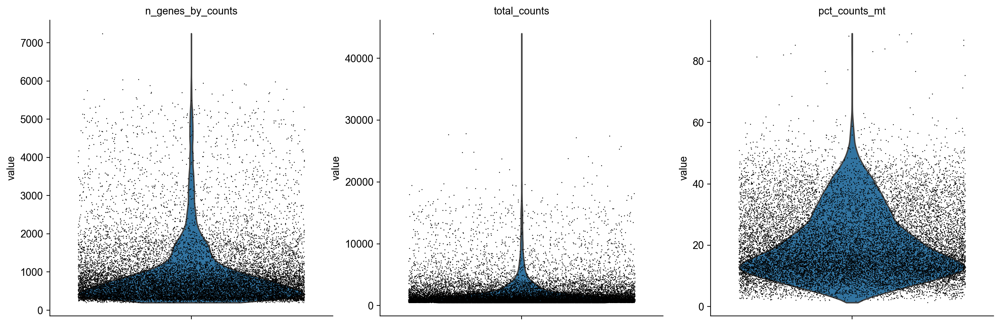

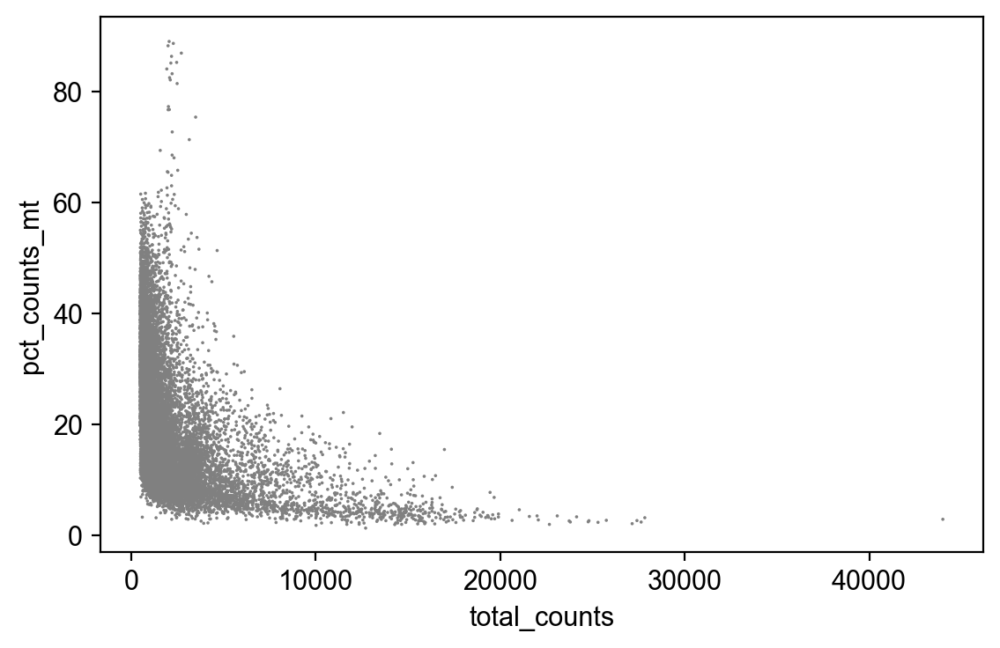

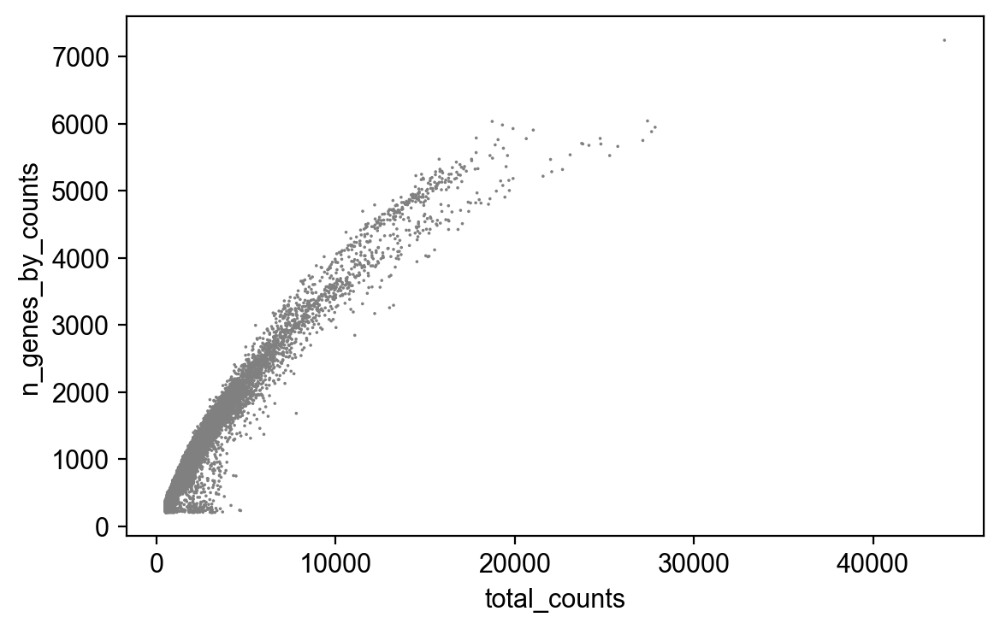

normalizing counts per cell
    finished (0:00:00)


C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [57]:
#filtering and normalization
sc.pp.filter_cells(bdata, min_genes=200)
sc.pp.filter_genes(bdata, min_cells=3)
bdata.var['mt'] = bdata.var_names.str.startswith('mt-')
sc.pp.calculate_qc_metrics(bdata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pl.violin(bdata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)
sc.pl.scatter(bdata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(bdata, x='total_counts', y='n_genes_by_counts')
bdata = bdata[bdata.obs.n_genes_by_counts < 2500, :]
bdata = bdata[bdata.obs.pct_counts_mt < 20, :]
sc.pp.normalize_total(bdata, target_sum=1e4)
sc.pp.log1p(bdata)

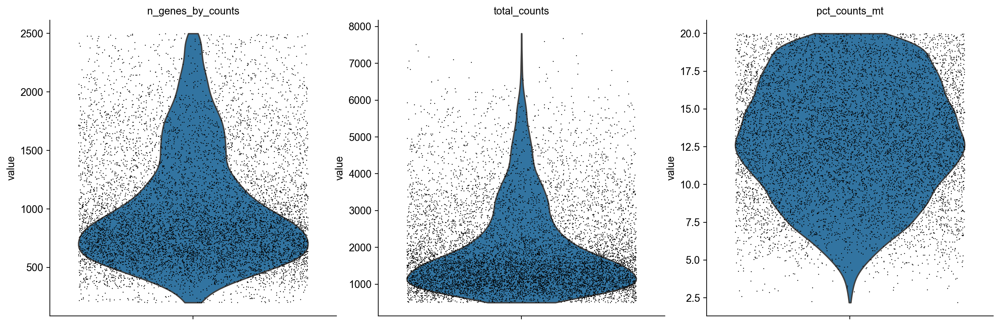

In [58]:
sc.pl.violin(bdata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


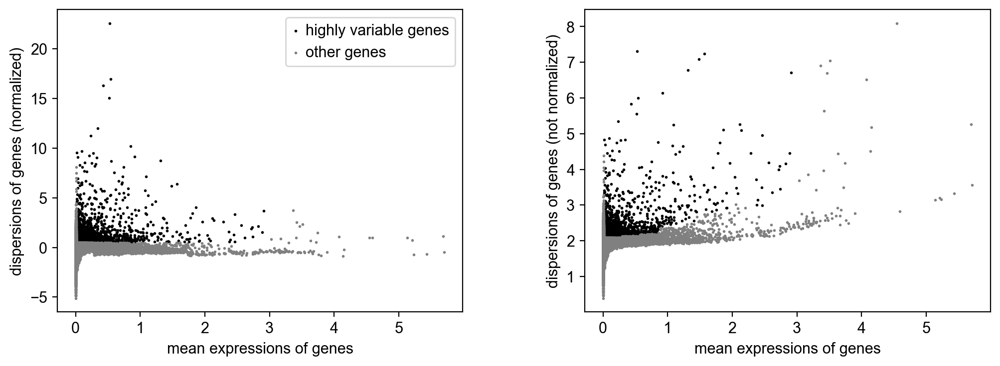

In [59]:
#identify highly variable genes
sc.pp.highly_variable_genes(bdata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(bdata)

In [60]:
bdata

AnnData object with n_obs × n_vars = 9254 × 18548
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

In [61]:
#set raw data
bdata.raw = bdata

In [62]:
#filtering, regression and scaling
bdata = bdata[:, bdata.var.highly_variable]

In [63]:
sc.pp.regress_out(bdata, ['total_counts', 'pct_counts_mt'])

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:13)


In [64]:
sc.pp.scale(bdata, max_value=10)

In [65]:
sc.pp.neighbors(bdata, n_neighbors=10, n_pcs=20)

computing neighbors
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:01)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)


In [66]:
sc.tl.pca(bdata, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)


computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)


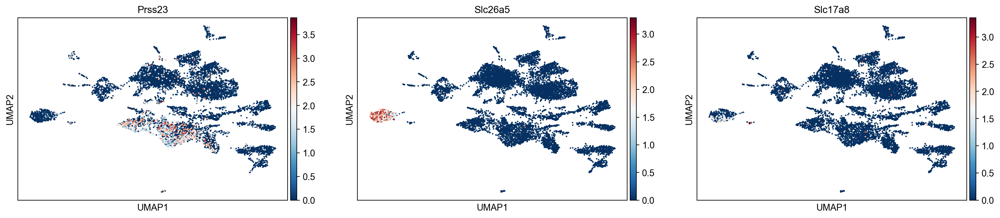

In [67]:
sc.tl.umap(bdata) 
sc.pl.umap(bdata, color=['Prss23', 'Slc26a5', 'Slc17a8']) 

In [69]:
var_names = adata.var_names.intersection(bdata.var_names)
adata = adata[:, var_names]
bdata = bdata[:, var_names]
sc.tl.ingest(bdata, adata, obs='leiden')

running ingest
    finished (0:00:10)


C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


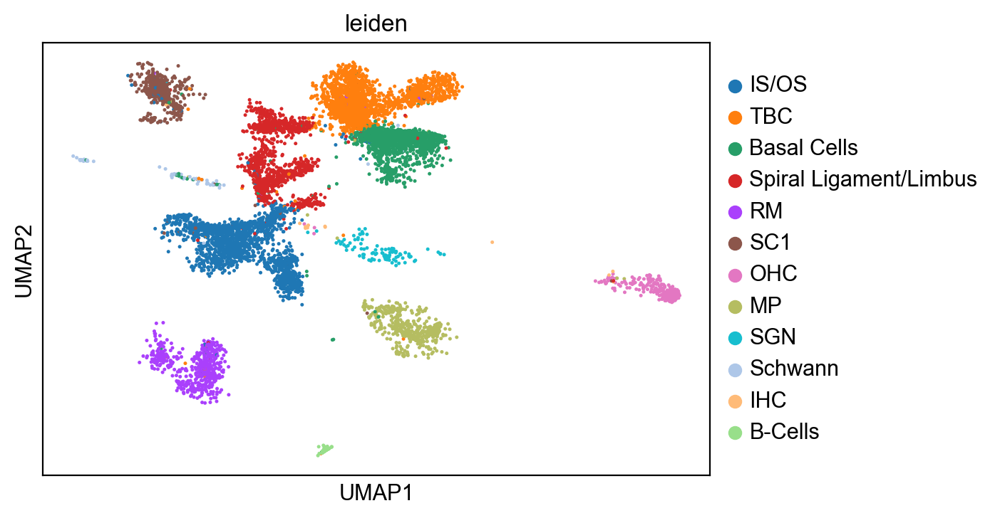

In [70]:
sc.pl.umap(bdata, color=['leiden'], wspace=0.5)

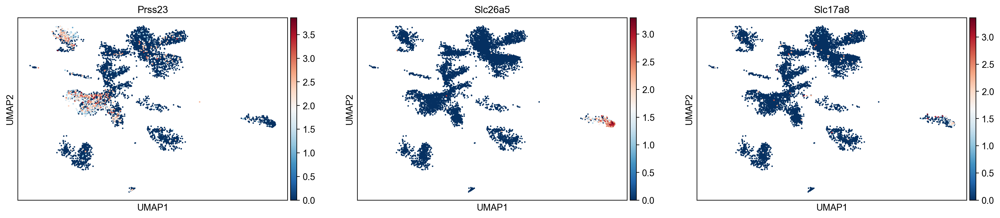

In [71]:
sc.pl.umap(bdata, color=['Prss23', 'Slc26a5', 'Slc17a8']) 

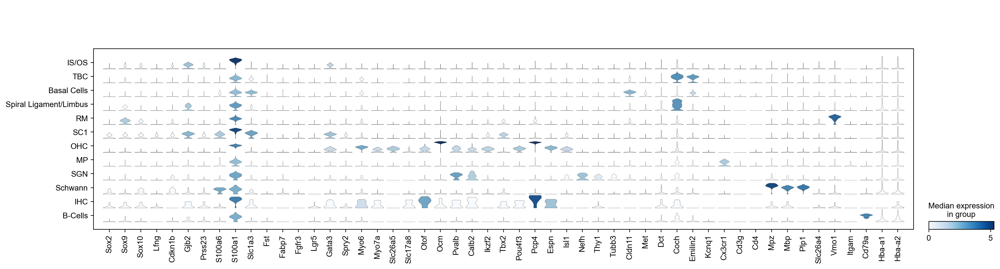

In [72]:
sc.pl.stacked_violin(bdata, marker_genes, groupby='leiden', rotation=90);

In [73]:
adata_concat = adata.concatenate(bdata, batch_categories=['28-1', '28-2'])

In [76]:
adata_concat.obs.leiden = adata_concat.obs.leiden.astype('category')
adata_concat.obs.leiden.cat.reorder_categories(adata.obs.leiden.cat.categories)  # fix category ordering

AAACCCAAGAGGACTC-1-28-1    IS/OS
AAACCCAAGTCACTGT-1-28-1      TBC
AAACCCAGTCGAACGA-1-28-1       MP
AAACCCAGTCGTCAGC-1-28-1    IS/OS
AAACCCAGTGATTCAC-1-28-1      SGN
                           ...  
TTTGTTGAGCACACCC-1-28-2    IS/OS
TTTGTTGAGCTGGCTC-1-28-2      SC1
TTTGTTGCAGAAATTG-1-28-2    IS/OS
TTTGTTGGTACGTACT-1-28-2      TBC
TTTGTTGGTCCTTAAG-1-28-2       RM
Name: leiden, Length: 15534, dtype: category
Categories (12, object): ['IS/OS', 'TBC', 'Basal Cells', 'Spiral Ligament/Limbus', ..., 'SGN', 'Schwann', 'IHC', 'B-Cells']

C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


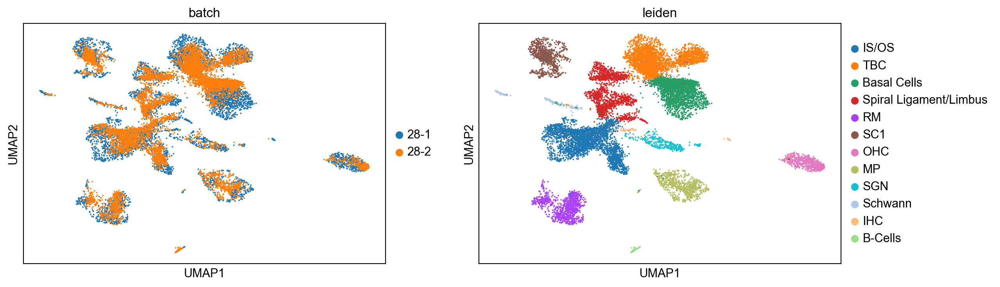

In [77]:
sc.pl.umap(adata_concat, color=['batch', 'leiden'])

C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


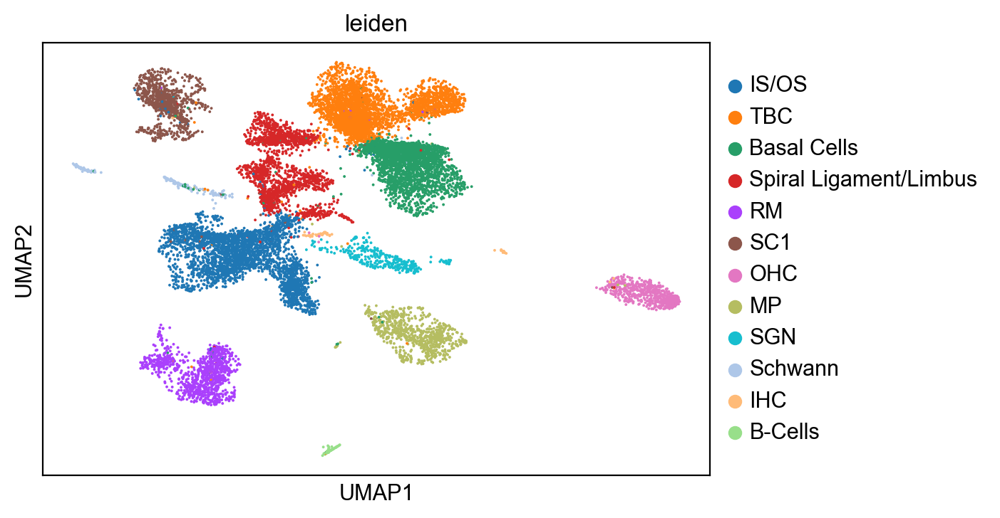

In [109]:
sc.pl.umap(adata_concat, color=['leiden'])

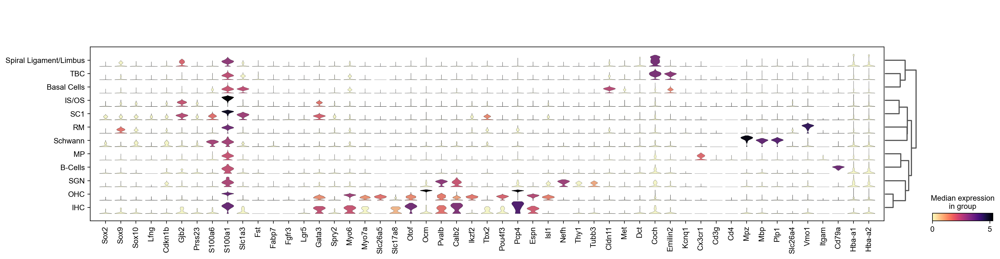

In [119]:
sc.pl.stacked_violin(adata_concat, marker_genes, groupby='leiden', rotation=90, dendrogram=True,
                      cmap='magma_r');

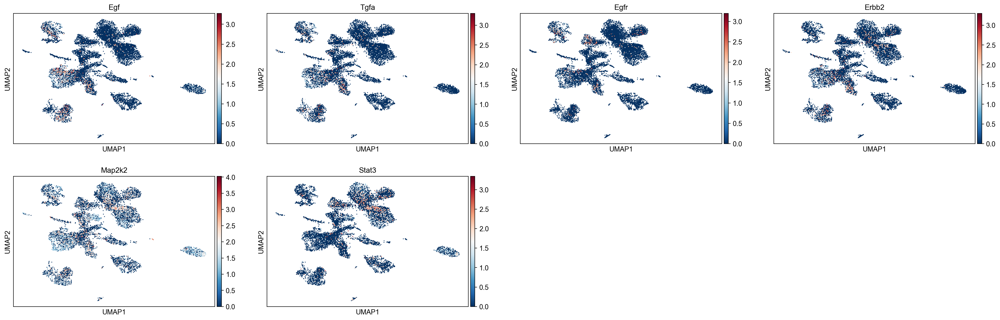

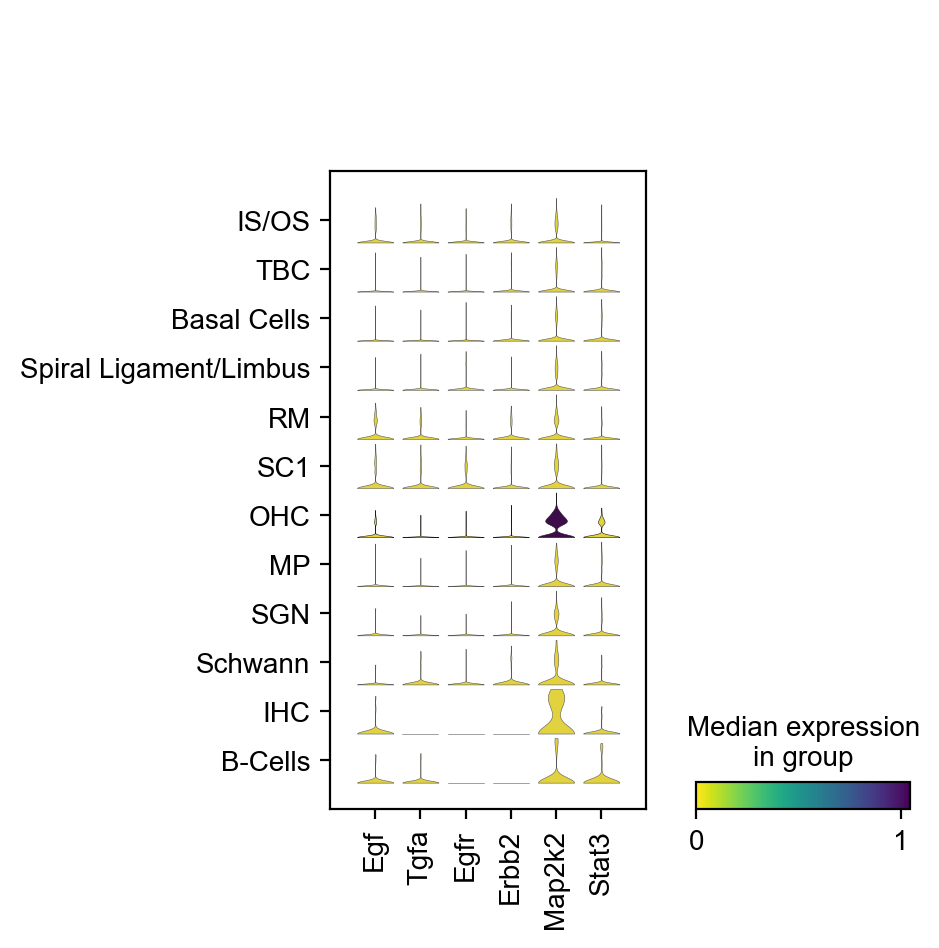

In [80]:
sc.pl.umap(adata_concat, color=egfr_genes)
sc.pl.stacked_violin(adata_concat, egfr_genes, groupby='leiden', rotation=90,
                      cmap='viridis_r');

In [81]:
adata_subset = adata_concat[adata_concat.obs['leiden'].isin(['IHC', 'OHC', 'SC1'])]

computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)


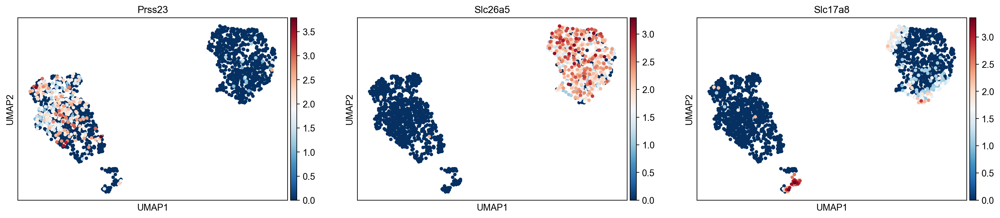

running Leiden clustering
    finished: found 3 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


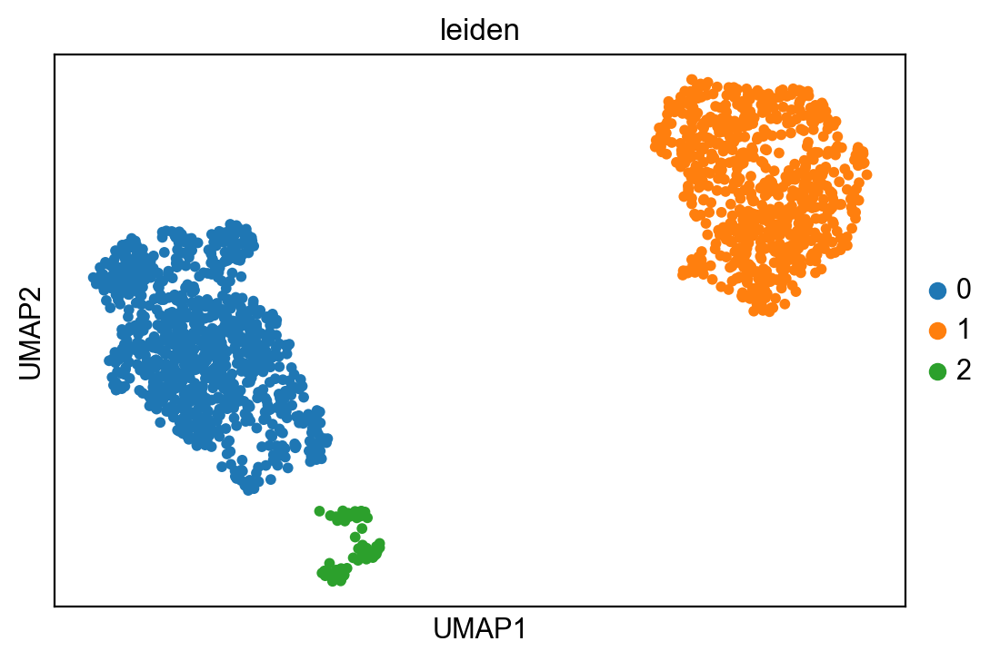

In [85]:
sc.pp.neighbors(adata_subset, n_neighbors=10, n_pcs=20)
sc.tl.pca(adata_subset, svd_solver='arpack')
sc.tl.umap(adata_subset) 
sc.pl.umap(adata_subset, color=['Prss23', 'Slc26a5', 'Slc17a8']) 
sc.tl.leiden(adata_subset, resolution = 0.1)
sc.pl.umap(adata_subset, color = 'leiden')

running Leiden clustering
    finished: found 4 clusters and added
    'leiden_R', the cluster labels (adata.obs, categorical) (0:00:00)


C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


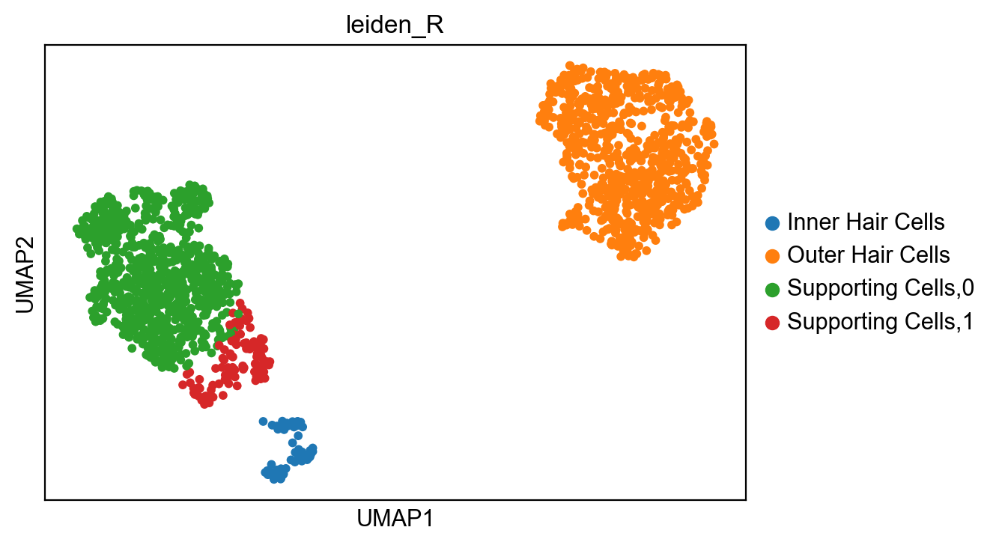

In [143]:
sc.tl.leiden(adata_subset, resolution = 0.12, restrict_to=('leiden', ['Supporting Cells']))
sc.pl.umap(adata_subset, color = 'leiden_R')

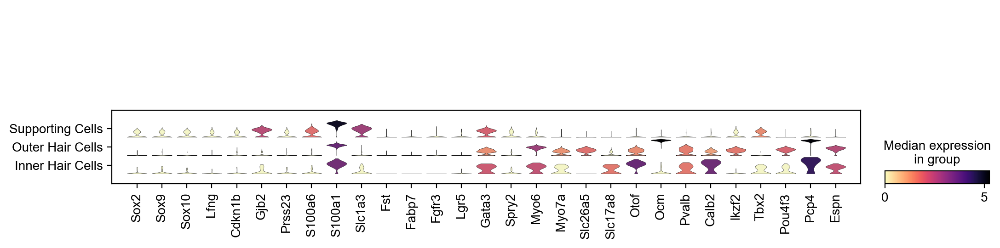

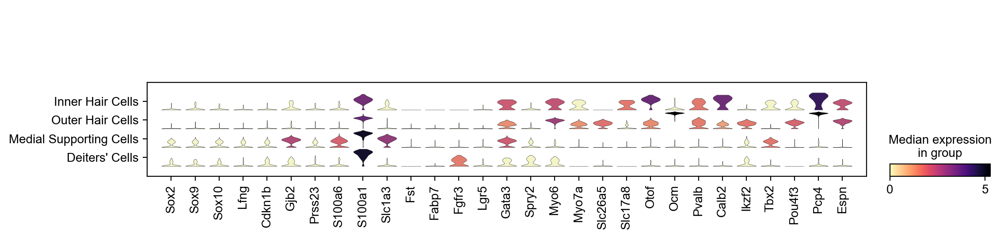

In [148]:
sc.pl.stacked_violin(adata_subset, subset_genes, groupby='leiden', rotation=90,
                      cmap='magma_r', ncols=1);
sc.pl.stacked_violin(adata_subset, subset_genes, groupby='leiden_R', rotation=90,
                      cmap='magma_r', ncols=1);

C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


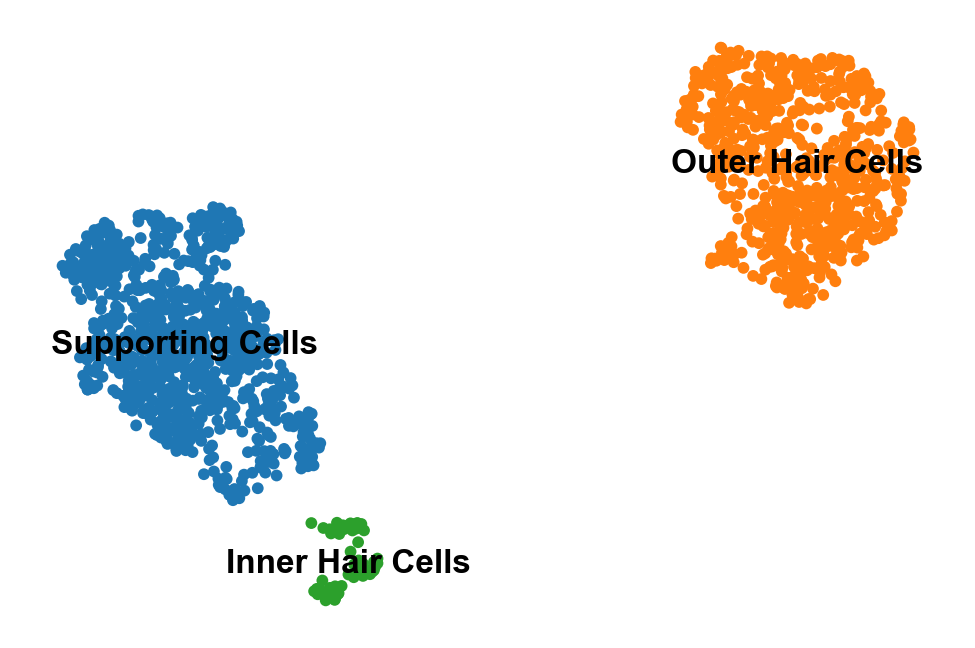

C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


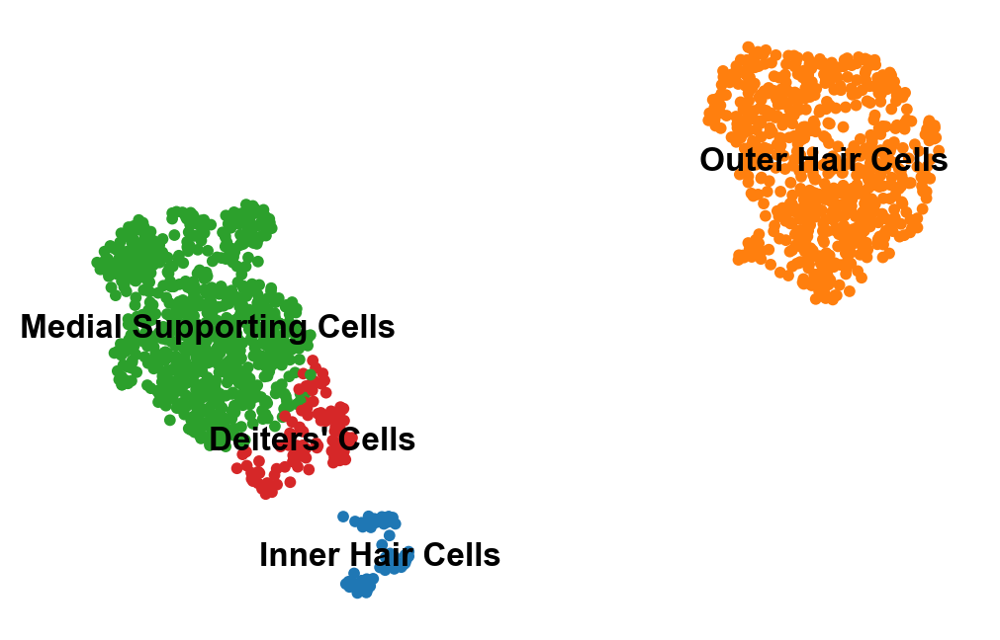

In [149]:
renamed_subclusters1 = ['Inner Hair Cells', 'Outer Hair Cells', 'Medial Supporting Cells', "Deiters' Cells"]
adata_subset.rename_categories('leiden_R', renamed_subclusters1)
sc.pl.umap(adata_subset, color='leiden', legend_loc='on data', title='', frameon=False)
sc.pl.umap(adata_subset, color='leiden_R', legend_loc='on data', title='', frameon=False)

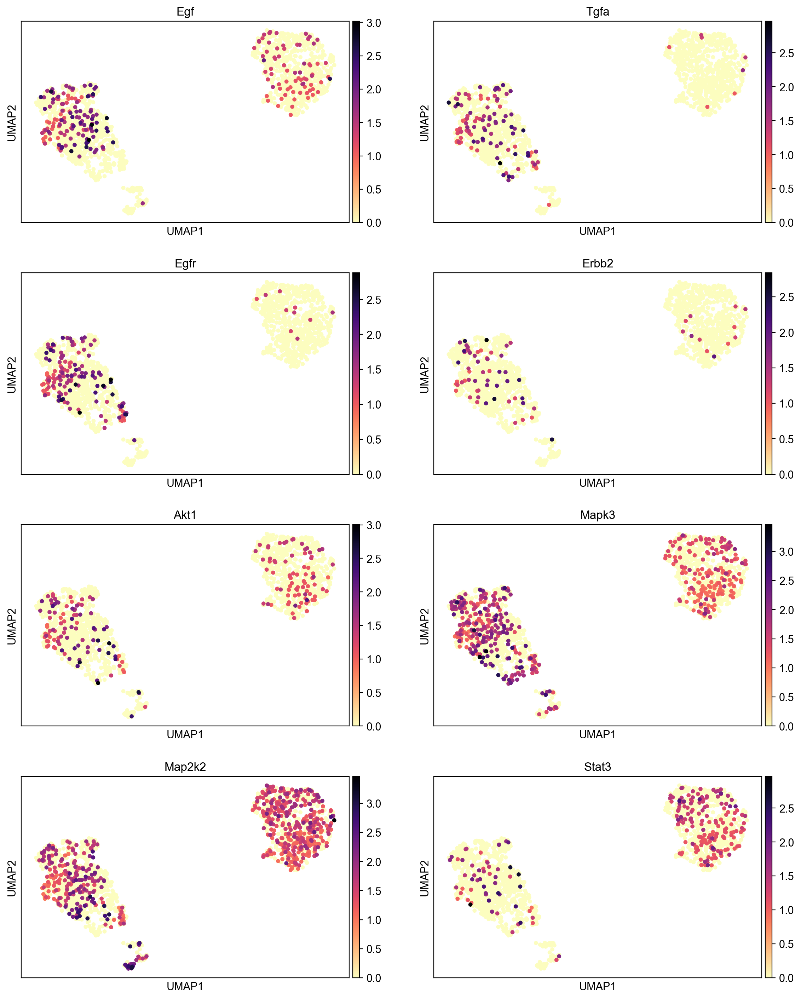

In [129]:
sc.pl.umap(adata_subset, color=egfr_genes, cmap=mpl.cm.magma_r, ncols=2)

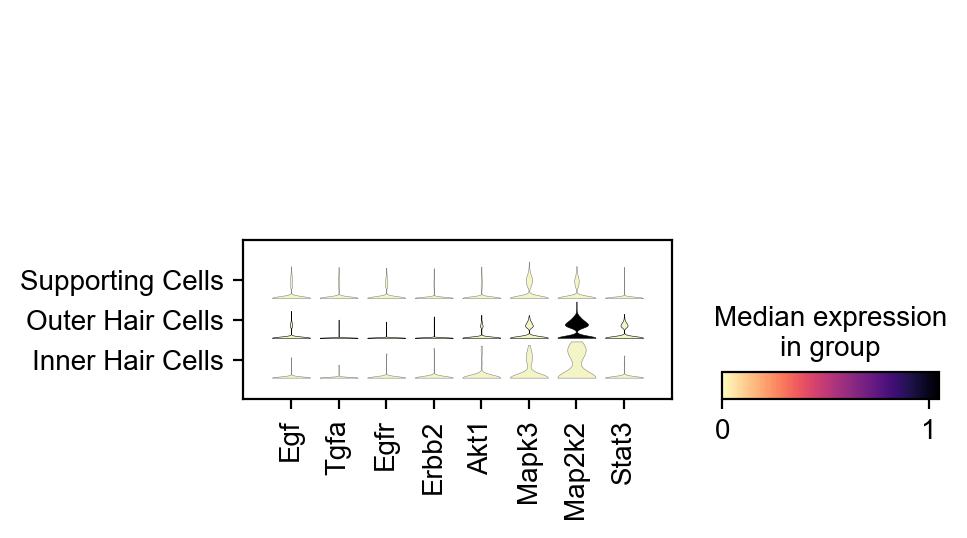

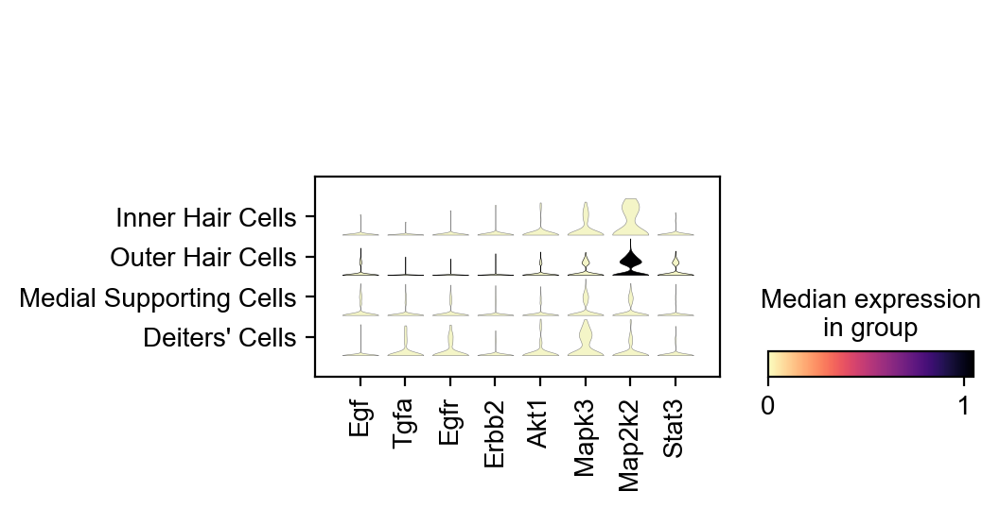

In [150]:
sc.pl.stacked_violin(adata_subset, egfr_genes, groupby='leiden', rotation=90,
                      cmap='magma_r', ncols=1);
sc.pl.stacked_violin(adata_subset, egfr_genes, groupby='leiden_R', rotation=90,
                      cmap='magma_r', ncols=1);

In [124]:
egfr_genes2 = ['Hbegf', 'Nrg1', 'Nrg4', 'Btc', 'Erbb3', 'Erbb4', 'Mapk1', 'Plcg1'] 

C:\Users\rvi33352\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


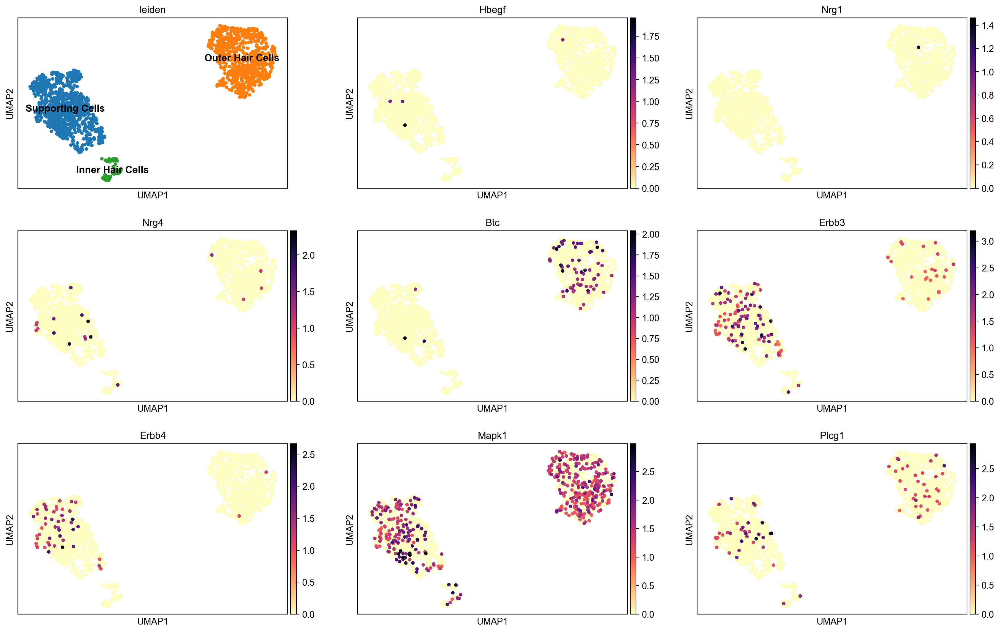

In [134]:
sc.pl.umap(adata_subset, color=['leiden','Hbegf', 'Nrg1', 'Nrg4', 'Btc', 'Erbb3', 'Erbb4', 'Mapk1', 'Plcg1'] , legend_loc='on data', cmap='magma_r', ncols=3)

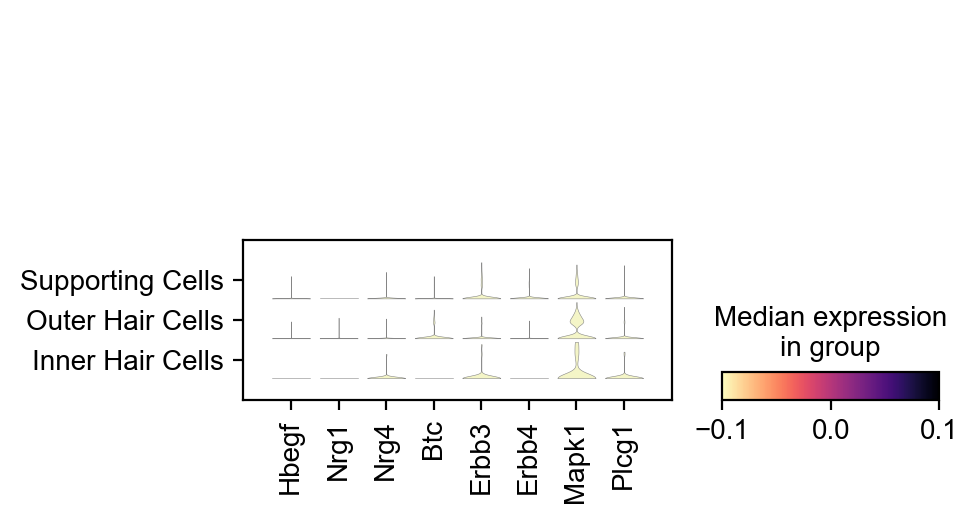

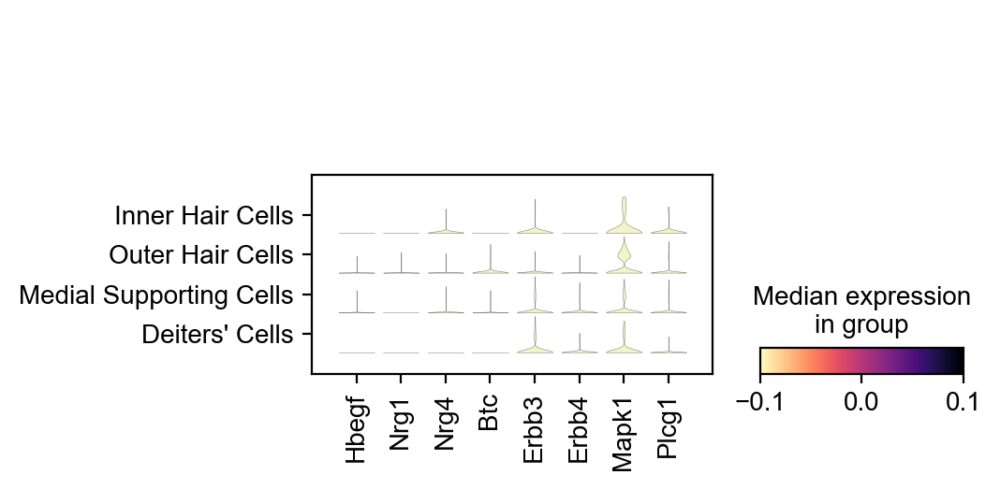

In [151]:
sc.pl.stacked_violin(adata_subset, egfr_genes2, groupby='leiden', rotation=90,
                      cmap='magma_r', ncols=1);
sc.pl.stacked_violin(adata_subset, egfr_genes2, groupby='leiden_R', rotation=90,
                      cmap='magma_r', ncols=1);

In [103]:
subset_genes = ["Sox2", "Sox9", "Sox10", "Lfng", "Cdkn1b", "Gjb2", "Prss23", "S100a6", 
                "S100a1", "Slc1a3", "Fst", "Fabp7", "Fgfr3", "Lgr5", "Gata3", "Spry2", "Myo6", 
                "Myo7a", "Slc26a5", "Slc17a8", "Otof", "Ocm", "Pvalb", "Calb2", "Ikzf2",
               "Tbx2", "Pou4f3", "Pcp4", "Espn"]

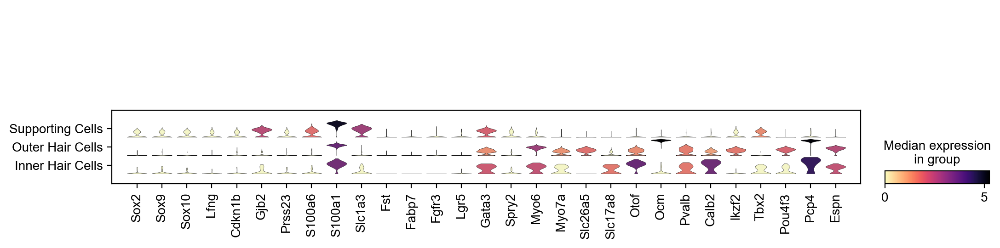

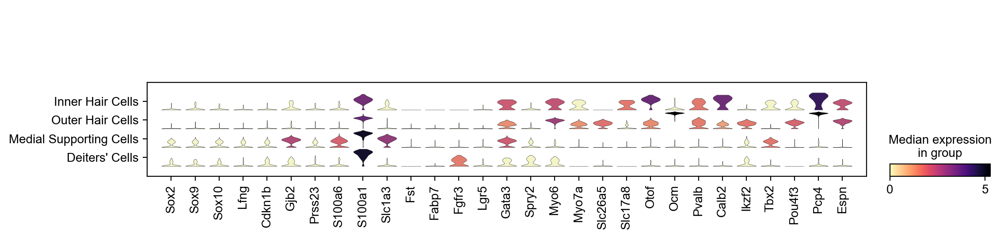

In [152]:
sc.pl.stacked_violin(adata_subset, subset_genes, groupby='leiden', rotation=90,
                      cmap='magma_r', ncols=1);
sc.pl.stacked_violin(adata_subset, subset_genes, groupby='leiden_R', rotation=90,
                      cmap='magma_r', ncols=1);